# Biological network topology analysis

**Objective**  
In this notebook you will learn how to build and analyse a network built from a co-expression analysis. Other types of networks including mixed networks (metabolite, PPI, gene, drug) can be equally built and analyzed, differing only in the functional analysis.

**Instructions**  
Further instructions are found [here](Topology.md).  

**Data**  
Download [the data folder](data/). You will start with the file [data/gene_expression.tsv](data/gene_expression.tsv), which contains the [TPMs](https://www.rna-seqblog.com/rpkm-fpkm-and-tpm-clearly-explained/) of 843 genes, and 48 samples.

**Software**  
This notebook relies on python's igraph for most of the analyses. Most, if not all, functions used here can also be applied with R's igraph. Other packages exist for network analysis including [networkx](https://networkx.github.io/) and [graph-tool](https://graph-tool.skewed.de/). [Snap.py](https://snap.stanford.edu/snappy/) is also a good alternative for large networks.

An introduction to network analysis in igraph in R can be [found here](https://kateto.net/networks-r-igraph).

In [1]:
import pandas as pd
import numpy as np
import igraph as ig
import sklearn
import sklearn.neighbors
import leidenalg
import scipy as sp
from statsmodels.stats.multitest import multipletests
import itertools
import gseapy as gp

# Plotting
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

# Data preparation

You will use a gene expression dataset (RNAseq, expressed as TPM) from a disease group with 48 samples. To keep analysis memory and time requirements reasonable for this lesson, we have selected 843 genes. We will assume that all the samples are viable for comparison and that no technical artifacts are present.

In [618]:
data=pd.read_csv('data/gene_expression.tsv', sep="\t")
data.head()

,Ensembl,d1,d2,d3,d4,d5,d6,d7,d8,d9,...,d39,d40,d41,d42,d43,d44,d45,d46,d47,d48
0,ENSG00000099139,266.248530,118.685241,82.477354,104.419678,167.485922,418.696939,181.247380,548.561273,1260.130553,...,144.488672,172.432442,229.954211,142.196028,8920.168028,435.411656,12358.423557,11065.632356,204.284841,51.301898
1,ENSG00000069869,2032.860627,508.666657,597.096207,791.764020,1191.455229,2214.861007,847.877531,1349.703710,4268.362797,...,921.040907,793.906638,945.178322,589.968351,6413.090161,1512.626974,6139.457180,7937.590063,1001.451178,257.875991
2,ENSG00000135968,9717.051734,806.122416,572.694806,746.572620,1345.392429,2091.007134,2622.375898,1831.016626,6407.623376,...,2038.687767,892.011392,1014.080032,612.632728,256.182783,3731.984678,292.854132,250.785615,1236.352656,372.172753
3,ENSG00000198763,1403.629543,1438.494499,824.791899,2293.688829,1537.980376,3646.921620,1584.486908,1255.460557,2810.873602,...,1492.646338,897.173416,3410.600336,2340.701018,3310.266644,1457.345526,2147.105589,4878.744790,1642.719602,1043.102254
4,ENSG00000198695,1255.366067,336.014532,260.434313,442.935521,584.620473,1178.658184,707.908334,801.624332,2262.288777,...,659.446396,408.809616,593.139410,427.210069,2132.363103,930.619201,3105.848138,6279.399357,421.579399,189.555490


We will use the annotations from the [Human Protein Atlas](https://www.proteinatlas.org/about/download) to map the above Ensembl ids to gene names. Ensembl ids with no name are dropped.

In [573]:
patlas=pd.read_csv('data/proteinatlas.tsv', sep="\t").loc[:,['Ensembl','Gene']]
data=pd.merge(data, patlas, on='Ensembl', how='inner')

No gene names are duplicated in this case, otherwise we would need to get an unique set of genes.

In [574]:
any(data.Gene.duplicated()) 

False

In [575]:
data=data.set_index('Gene')
data=data.loc[:,data.columns!='Ensembl']
data.shape #755 genes, 48 samples

(755, 48)

In [576]:
data.head()

,d1,d2,d3,d4,d5,d6,d7,d8,d9,d10,...,d39,d40,d41,d42,d43,d44,d45,d46,d47,d48
Gene,,,,,,,,,,,,,,,,,,,,,
PCSK5,266.248530,118.685241,82.477354,104.419678,167.485922,418.696939,181.247380,548.561273,1260.130553,332.491335,...,144.488672,172.432442,229.954211,142.196028,8920.168028,435.411656,12358.423557,11065.632356,204.284841,51.301898
NEDD4,2032.860627,508.666657,597.096207,791.764020,1191.455229,2214.861007,847.877531,1349.703710,4268.362797,1792.668360,...,921.040907,793.906638,945.178322,589.968351,6413.090161,1512.626974,6139.457180,7937.590063,1001.451178,257.875991
GCC2,9717.051734,806.122416,572.694806,746.572620,1345.392429,2091.007134,2622.375898,1831.016626,6407.623376,1933.213252,...,2038.687767,892.011392,1014.080032,612.632728,256.182783,3731.984678,292.854132,250.785615,1236.352656,372.172753
MT-ND2,1403.629543,1438.494499,824.791899,2293.688829,1537.980376,3646.921620,1584.486908,1255.460557,2810.873602,2286.789375,...,1492.646338,897.173416,3410.600336,2340.701018,3310.266644,1457.345526,2147.105589,4878.744790,1642.719602,1043.102254
MT-ND6,1255.366067,336.014532,260.434313,442.935521,584.620473,1178.658184,707.908334,801.624332,2262.288777,641.525983,...,659.446396,408.809616,593.139410,427.210069,2132.363103,930.619201,3105.848138,6279.399357,421.579399,189.555490


We will start by filtering samples by removing genes whose expression is consistently low (median TPM < 1)

In [577]:
proc_data=data.copy()
proc_data=proc_data.loc[proc_data.median(1)>1]
proc_data.shape #499 genes

(499, 48)

A very quick view shows that several gene clusters are found, including two major groups. However, the analysis below does not perform any statistical filtering.

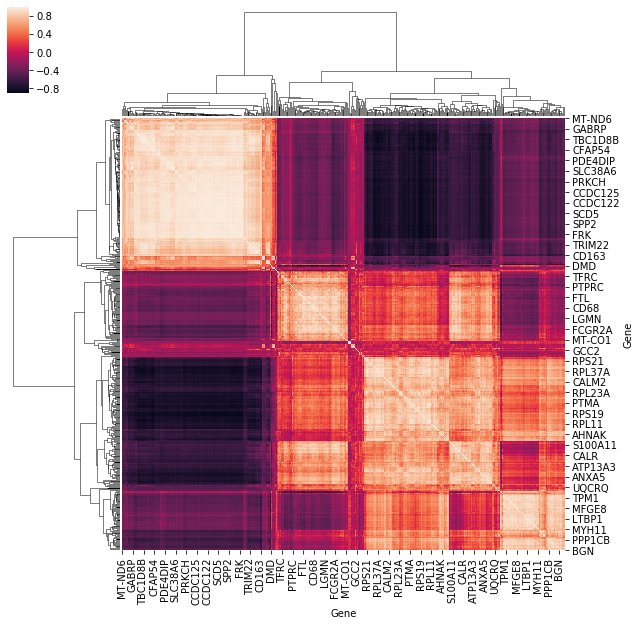

In [578]:
gene_correlations=proc_data.T.corr()
sns.clustermap(gene_correlations);

We will save this initial filtered dataset for further analysis in the sections below.

In [579]:
proc_data.to_csv('data/filtered_gene_expression.tsv', sep="\t")

# Co-expression analysis

Our initial network analysis will be performed on a co-expression network using Spearman correlations. Because this network has a big chance of producing false positives we will consider [Bonferroni correction](https://en.wikipedia.org/wiki/Bonferroni_correction) to control for familywise error, as well as [FDR](https://en.wikipedia.org/wiki/False_discovery_rate#Benjamini%E2%80%93Hochberg_procedure).

In [696]:
#Columns are samples, rows are genes
data=pd.read_csv('data/filtered_gene_expression.tsv', sep="\t", index_col=0)

An important consideration when performing correlation analysis is how to deal with `NA`.
 - Should you remove samples?
 - Should you do any sort of imputation? (e.g. mean/median imputation)
 - Should you replace them with 0?
 
This will depend on the type of that that you have, and will severely affect downstream results. It is thus important to carefully think about this.

In [697]:
data.isna().any().any() #we have no rows with NA

False

We will perform a gene-gene correlation analysis by computing pairwise [Spearman correlations](https://docs.scipy.org/doc/scipy-0.14.0/reference/generated/scipy.stats.spearmanr.html#scipy.stats.spearmanr). Choosing other non-parametric (Kendall or Spearman) vs parametric (Pearson) methods depends on your data. Here, because we have a relatively small sample size and want to save on computational time we choose Spearman. 

The following takes a few minutes to run on a normal laptop, so you may instead load the resulting  `correlations` table.

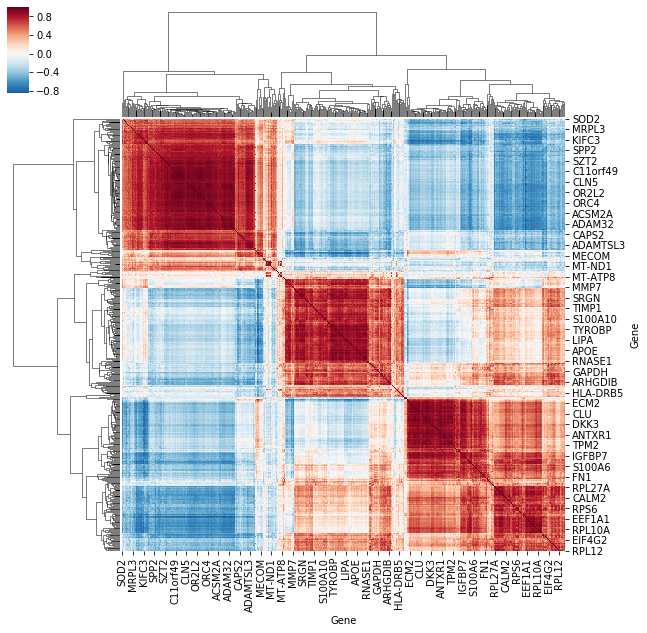

In [698]:
#Correlation and P val matrices
Rmatrix, Pmatrix= sp.stats.spearmanr(data.T)
Rmatrix=pd.DataFrame(Rmatrix, index=data.index.copy(), columns=data.index.copy())
sns.clustermap(Rmatrix, cmap="RdBu_r", center=0); #resulting R matrix, similar to that seen in the section above

We can already see that many of the correlations in the top right columns are not significant even before multiple hypothesis correction:

/Users/rui.benfeitas/OneDrive/GitHub/workshop_omics_integration/_hidden/session_topology/top-env/lib/python3.7/site-packages/seaborn/matrix.py:603: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  metric=self.metric)


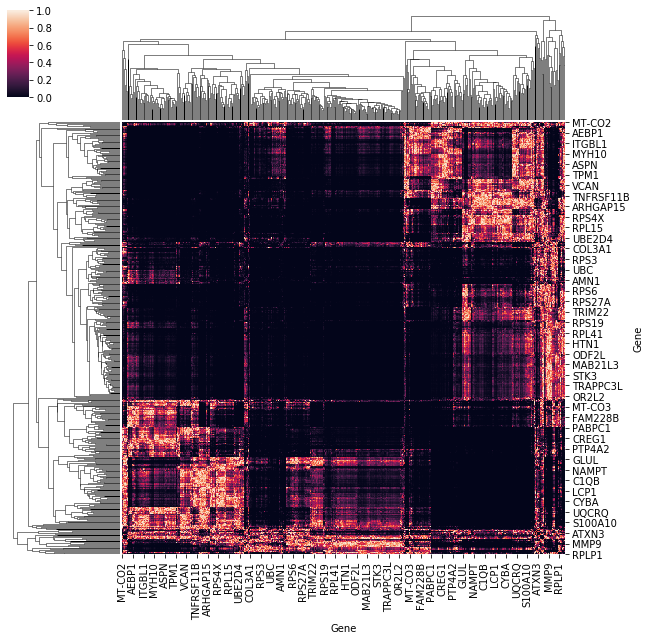

In [699]:
Pmatrix=pd.DataFrame(Pmatrix, index=data.index.copy(), columns=data.index.copy())
sns.clustermap(Pmatrix); #resulting R matrix, similar to that seen in the section above

We will now adjust the P values based on the (big) number of comparisons done. For just 499 genes, we have a total of $499^2 = 249001$ correlations. However, these numbers consider that the same correlation is computed twice (gene A vs gene B, and gene B vs gene A), and include the this number considers many correlations that were computed twice, so the true number of comparisons is half of that above, minus the correlation of a gene with itself.   
This means $\frac{499!}{2!(499-2)!} = 124251$ correlations. At an error rate of 0.05, this means that the probability of finding at least one false positive is nearly 100%: $1-0.95^{124251} \approx 1$. We thus need to correct P values. We will apply a Bonferroni correction as well as a FDR correction.

In [700]:
###Gets the upper triangular matrix
Psquared=Pmatrix.where(np.triu(np.ones(Pmatrix.shape),1).astype(np.bool))
Psquared.columns.name='Gene2'

#R  matrix manpulation to prepare for merging with P matrix
Rmatrix=Rmatrix.stack()
Rmatrix.index.names=['v1','v2'] #Avoid stacked names colliding
Rmatrix=Rmatrix.reset_index()
Rmatrix.columns=['gene1','gene2','R']

#P  matrix manpulation to prepare for merging with P matrix
Pmatrix=Pmatrix.stack()
Pmatrix.index.names=['v1','v2']
Pmatrix=Pmatrix.reset_index()
Pmatrix.columns=['gene1','gene2','P']

PRmatrix=pd.merge(Rmatrix, Pmatrix, on=['gene1','gene2']) #Correlation matrix with both R and P

In [701]:
#Multiple hypothesis correction computed on the P column
adjP=pd.DataFrame(multipletests(PRmatrix['P'], method='bonferroni', alpha=0.01)[1], columns=['Padj'])
FDR=pd.DataFrame(multipletests(PRmatrix['P'], method='fdr_bh', alpha=0.01)[1], columns=['FDR'])

PRmatrix=pd.concat([ PRmatrix, adjP], axis=1)
PRmatrix=pd.concat([ PRmatrix, FDR], axis=1)

# PRmatrix.to_csv('data/coexpression_matrix.tsv', sep="\t", index=False) #saves the matrix
PRmatrix.head()

,gene1,gene2,R,P,Padj,FDR
0,PCSK5,PCSK5,1.000000,0.000000e+00,0.000000e+00,0.000000e+00
1,PCSK5,NEDD4,0.918910,3.309525e-20,8.240751e-15,1.736723e-18
2,PCSK5,GCC2,0.342162,1.729265e-02,1.000000e+00,3.180475e-02
3,PCSK5,MT-ND2,0.424012,2.670645e-03,1.000000e+00,6.208682e-03
4,PCSK5,MT-ND6,0.894594,1.054674e-17,2.626149e-12,3.285561e-16


Considering the Bonferroni correction we find 37663 correlations that are statistically significant at an $\alpha = 0.01$. If we consider instead FDR as correction method, we find 144953, which at a FDR of 0.01 implies `0.01 \times 144953 = 1141` false positives.

In [702]:
sum(PRmatrix.Padj<0.01)

37663

In [703]:
sum(PRmatrix.FDR<0.01)

114189

Let's add two additional columns, where we assign `R=0` for those correlations that are not statistically significant (`adjusted P` or `FDR > 0.01`). 

In [704]:
PRmatrix.loc[:,'R (padj)']=PRmatrix['R'].copy()
PRmatrix.loc[:,'R (fdr)']=PRmatrix['R'].copy()
PRmatrix.loc[PRmatrix['Padj']>0.01,'R (padj)']=0
PRmatrix.loc[PRmatrix['FDR']>0.01,'R (fdr)']=0

Now we can see how the initial heatmap of correlations looks.

In [705]:
#Transforming to a squared matrix again
PRQ=pd.concat([
    PRmatrix.copy(), 
    PRmatrix.copy().rename(columns={'gene1':'gene2','gene2':'gene1'}).loc[:,PRmatrix.columns]
         ]).drop_duplicates()

Rmatrix_padj=PRQ.copy().pivot(index='gene1',columns='gene2',values='R (padj)')
Rmatrix_fdr=PRQ.copy().pivot(index='gene1',columns='gene2',values='R (fdr)')

Rmatrix_padj=Rmatrix_padj.loc[Rmatrix_padj.index,Rmatrix_padj.index]
Rmatrix_fdr=Rmatrix_fdr.loc[Rmatrix_padj.index,Rmatrix_padj.index]

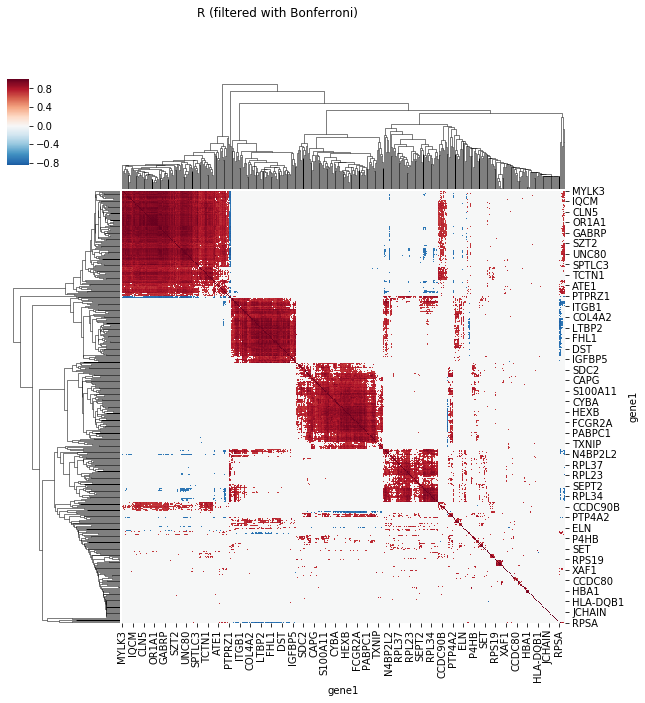

In [706]:
g=sns.clustermap(Rmatrix_padj, cmap="RdBu_r", center=0);
g.fig.suptitle('R (filtered with Bonferroni)');
plt.show()

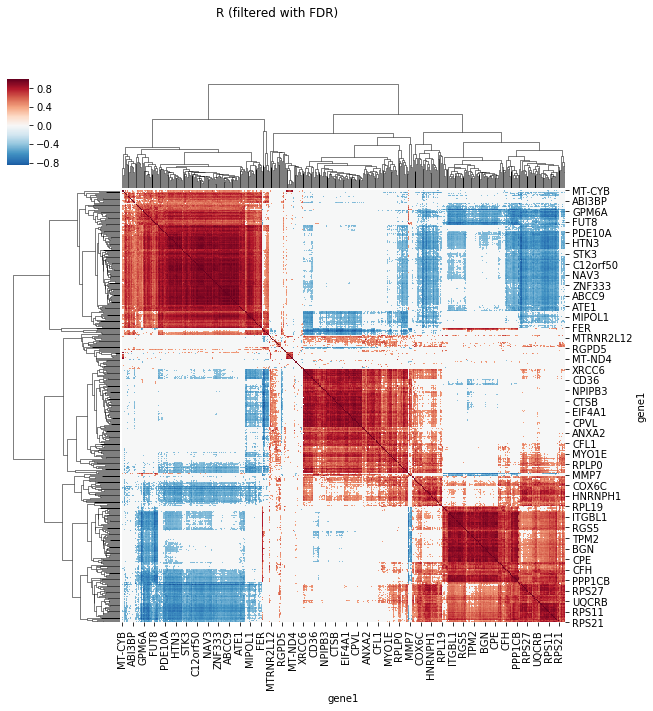

In [707]:
g=sns.clustermap(Rmatrix_fdr, cmap="RdBu_r", center=0);
g.fig.suptitle('R (filtered with FDR)');
plt.show()

The plots above show that the Bonferroni correction is only selecting very high (absolute) correlations. This may remove false positives, but it may also remove slightly weaker correlations that are biologically relevant. The Bonferroni correction also removes most of the negatively-coexpressed genes. Notice this from the distribution of correlation coefficients:

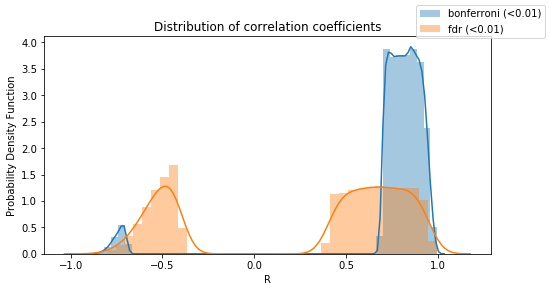

In [722]:
shortPR=PRmatrix.copy().loc[:,['gene1','gene2','R (padj)','R (fdr)']]
shortPR=shortPR.loc[shortPR.gene1!=shortPR.gene2]

fig=plt.figure(figsize=(8,4))
sns.distplot(shortPR['R (padj)'][shortPR['R (padj)']!=0]);
sns.distplot(shortPR['R (fdr)'][shortPR['R (fdr)']!=0]);
fig.legend(labels=['bonferroni (<0.01)','fdr (<0.01)']);
plt.xlabel('R')
plt.ylabel('Probability Density Function')
plt.title('Distribution of correlation coefficients')
plt.show()

We can also observe that the Bonferroni correction yields a more homogeneous number of co-expressed genes for each gene (i.e. first neighbors), compared to the FDR filtering. Notice how for a subset of genes many correlations are identified (>300/498).

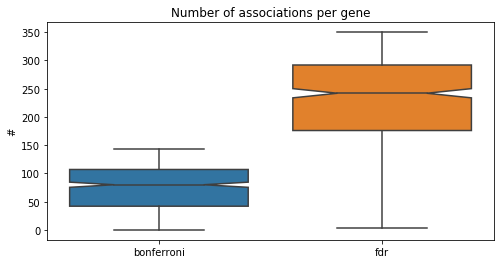

In [719]:
gene_associations_padj=pd.concat([
    shortPR.copy().loc[shortPR['R (padj)']!=0,][['gene1','gene2']],
    shortPR.copy().loc[shortPR['R (padj)']!=0,][['gene2','gene1']].rename(columns={'gene1':'gene2','gene2':'gene1'})]).drop_duplicates().groupby('gene1').agg('count')

gene_associations_fdr=pd.concat([
    shortPR.copy().loc[shortPR['R (fdr)']!=0,][['gene1','gene2']],
    shortPR.copy().loc[shortPR['R (fdr)']!=0,][['gene2','gene1']].rename(columns={'gene1':'gene2','gene2':'gene1'})]).drop_duplicates().groupby('gene1').agg('count')

gene_associations=pd.concat([gene_associations_padj, gene_associations_fdr],1, sort=True)
gene_associations.fillna(0,inplace=True)
gene_associations.columns=['bonferroni','fdr']

fig=plt.figure(figsize=(8,4))
sns.boxplot( data=gene_associations, notch=True);
plt.title('Number of associations per gene')
plt.ylabel('#')
plt.show()

### Questions:
In building a graph from a co-expression network:
- How will you deal with the positive and negative sets of correlations above?
- Will you consider the network as weighted? Directed?
- Which dataset would you select for further analysis: the Bonferroni or the FDR-corrected? Why?
- What preliminary tests would you perform on the graph to assess whether node relationships are random?

# Network construction and preliminary analysis

We will now build 2 different networks to analyse further:
- A full co-expression network filtered using FDR-corrected P values (<0.01). This is an unweighted network.
- The subset of positively co-expressed genes, where correlation coefficient is used as weight.
- k-NNG that we will generate from the expression profile. This will be unweighted.
- A random network based on the [Erdos-Renyi model](https://en.wikipedia.org/wiki/Erd%C5%91s%E2%80%93R%C3%A9nyi_model), with the same node and edge number as the first (full) network. This will be a null-model for our analyses. The idea is that if a certain property found in one of our graphs is  reproduced in a random graph, then we do not need to account for any other possible explanations for that feature. In other words, if a property of a graph (e.g. clustering) is not found in a random network, we can assume that it does not appear in our biological network due to randomness.

In [3]:
# Prepares table for being read by igraph
PRmatrix=pd.read_csv('data/coexpression_matrix.tsv', sep="\t")
PRmatrix.loc[PRmatrix['FDR']>0.01,'R (fdr)']=0
PRmatrix=PRmatrix.loc[PRmatrix['R (fdr)']!=0,['gene1','gene2','R (fdr)']]
PRmatrix=PRmatrix.loc[PRmatrix.gene1!=PRmatrix.gene2] #drops self correlations

fdr_pos_mat=PRmatrix.loc[PRmatrix['R (fdr)']>0]
fdr_neg_mat=PRmatrix.loc[PRmatrix['R (fdr)']<0]

We will now build the k-NNG, using gene-gene distances as input to determine the nearest neighbours. Because data is expressed in comparable units (TPM), we can go ahead and build the network from the distances between features. If features were not comparable because they would come from different datasets (e.g. metabolomic and proteomic), they would need to be normalized. We'll select the top 50 neighbours for each gene.

In [4]:
#Computes a kNN adjacency matrix from the input dataset
#and prepares table for being read by igraph
data=pd.read_csv('data/filtered_gene_expression.tsv', sep="\t", index_col=0)
knnG=sklearn.neighbors.kneighbors_graph(data, 50, metric='euclidean')
knnG=pd.DataFrame(knnG.toarray(), columns=data.index.copy(), index=data.index.copy())  #adjacency matrix
knnG.index.name='gene1'
knnG.columns.name='gene2'
knnG=knnG.stack().reset_index().rename(columns={0:'Connectivity'})
knnG=knnG.loc[knnG['Connectivity']!=0]

We will now generate the graphs from the dataframes above

In [5]:
#positive coexpressions, weighted
pos_w=ig.Graph.TupleList([tuple(x) for x in fdr_pos_mat.values], directed=False, edge_attrs=['w'])

#full network, unweighted
all_u=ig.Graph.TupleList([tuple(x) for x in PRmatrix.values], directed=False)

#knnG, unweighted
knn=ig.Graph.TupleList([tuple(x) for x in knnG.values], directed=False)

#random network, unweighted, node and edge number based on overall network
random=ig.Graph.Erdos_Renyi(n=499, m=PRmatrix.shape[0], directed=False, loops=False)

For representation purposes we will see how the knn graph looks - be careful in drawing the others, as they have many more edges it becomes computationally heavy.

In [6]:
#This plots each graph, using degree to present node size:
knn.vs['degree']=knn.degree() 
knn.vs['degree_size']=[(x*20)/(max(knn.vs['degree'])) for x in knn.vs['degree']] #degree is multiplied by 10 so that we can see all nodes

layout = knn.layout_mds()
ig.plot(knn, layout=layout, vertex_color='white', edge_color='silver', vertex_size=knn.vs['degree_size'])

We can see that while the same number of nodes is found in all networks, the number of edges varies greatly. We also see that the network is fully connected, which is not allways the case. If it wasn't connected, we could select the *k* largest connected components, and proceed the analyses with them. The largest connected component is called the *giant component*.

In [7]:
#function to get graph properties
def graph_prop(input_graph):
    ncount=nn.vcount()
    ecount=nn.ecount()
    diameter=nn.diameter()
    av_path=nn.average_path_length()
    dens=nn.density()
    clustering=nn.transitivity_undirected() #this is the global clustering coefficient
    conn=nn.is_connected()
    min_cut=nn.mincut_value()
    out=pd.DataFrame([ncount, ecount, diameter, av_path, dens, clustering, conn, min_cut],
                 index=['node_count','edge_count','diameter','av_path_length','density','clustering_coef','connected?','minimum_cut']).T
    return(out)

#summarizing graph properties
network_stats=pd.DataFrame()
for nn in [pos_w, all_u, knn, random]:
    network_stats=pd.concat([network_stats,graph_prop(nn)])
    
network_stats.index=['pos_w','all_u','knn','random']
network_stats

,node_count,edge_count,diameter,av_path_length,density,clustering_coef,connected?,minimum_cut
pos_w,499,75818,5,2.18904,0.6102,0.841979,True,6
all_u,499,113690,4,1.55834,0.915003,0.743058,True,6
knn,499,24950,5,2.62002,0.200803,0.645208,True,50
random,499,113690,2,1.085,0.915003,0.91497,True,433


### Questions:
- Why is the diameter and average path length lower in the case of the full network and the random network, compared to the other two networks?
- Why do you think the clustering coefficient is lower for the knn compared with the other networks?
- Why is the minimum cut much larger in the random network compared to the others?

# Centrality analysis

We'll look into different centrality measures:
- [Degree](https://en.wikipedia.org/wiki/Degree_(graph_theory)) - number of neighbors of a node
- [Betweenness](https://en.wikipedia.org/wiki/Betweenness_centrality) - measures how many shortest paths in the network pass through a node.
- [Closeness](https://en.wikipedia.org/wiki/Centrality#Closeness_centrality) - the average length of the shortest paths between a node and all other nodes 
- [Eccentricity](https://en.wikipedia.org/wiki/Distance_(graph_theory)) - largest shortest path from a node to any other node. Nodes with high eccentricity tend to be on the periphery.

Degree, Betweenness and Closeness are additionally computed for the positive coexpression network by taking into account each edge's weight. For instance, for degree this is done for each node by summing each edge's degree. 

Because the number of shortest paths in a network scales with the network size, we normalize Eccentricity and Betweenness with respect to the network size so that they can be compared between the four networks above.

**Degree distribution**  
Let's start by comparing the degrees of the random network against the three other networks. From the figures below it seems that there is no relationship between the degree of the random network, and any of the three others.

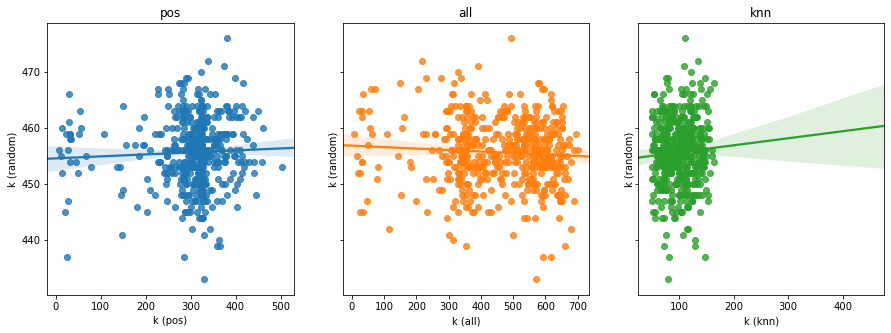

In [408]:
fig, axes=plt.subplots(nrows=1, ncols=3, figsize=(15,5), sharey='row')

for i, ax in zip(range(4), axes.flat):
    sns.regplot([pos_w,all_u,knn][i].degree(), random.degree(), ax=ax);
    ax.set_title(['pos','all','knn'][i])
    ax.set(xlabel='k ('+['pos','all','knn'][i]+')', ylabel='k (random)')


In [228]:
def transform_degree(graph):
    alldegs=graph.degree()
    alldegs=pd.DataFrame([[key,len(list(group))] for key,group in itertools.groupby(alldegs)], columns=['k','count'])
    alldegs['P(k)']=[x/alldegs['count'].sum() for x in alldegs['count']]
    alldegs=alldegs.loc[:,['k','P(k)']]
    alldegs.drop_duplicates(inplace=True)
    alldegs.reset_index(drop=True, inplace=True)
    return(alldegs)

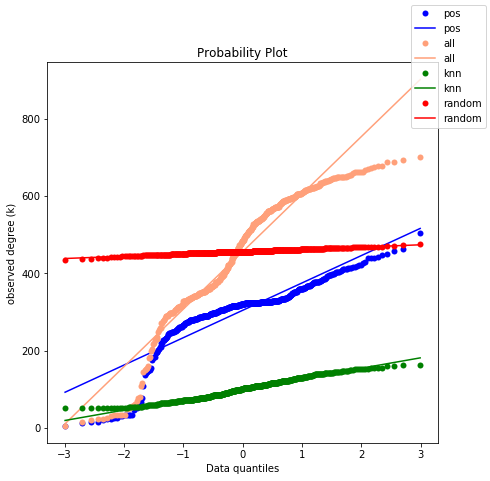

In [376]:
fig, ax = plt.subplots(figsize=(7, 7))
# ax.set(yscale='log', xscale='log')
p=sp.stats.probplot(pos_w.degree(), plot=ax)
a=sp.stats.probplot(all_u.degree(), plot=ax)
k=sp.stats.probplot(knn.degree(), plot=ax)
r=sp.stats.probplot(random.degree(), plot=ax)

col=['blue','','lightsalmon','','green','','red']
for x in np.arange(0,7,2):
    ax.get_lines()[x].set_markerfacecolor(col[x])
    ax.get_lines()[x].set_markeredgewidth(0)
    ax.get_lines()[x+1].set_color(col[x])


fig.legend(labels=['pos','pos','all','all','knn','knn','random','random']);

ax.set(xlabel='Data quantiles', ylabel='observed degree (k)')
plt.show()

**Centrality**  
We will now compare different centrality metrics between the graphs.

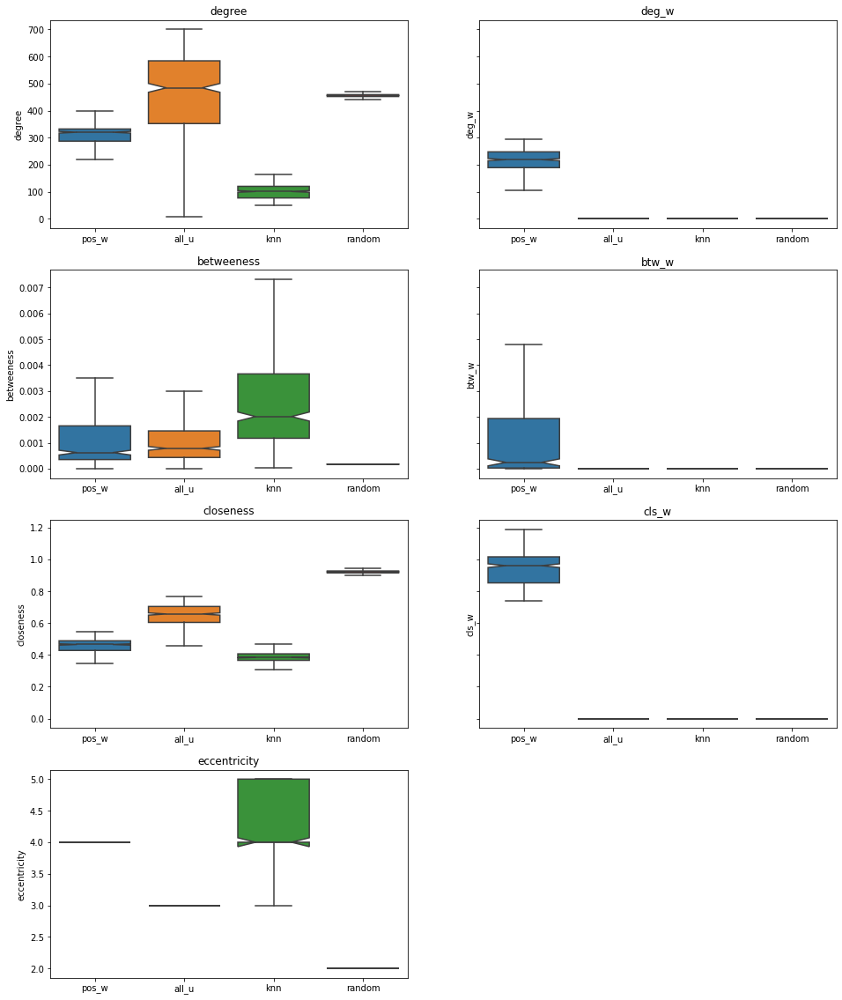

In [135]:
#function to compute different centrality measures
def combine_raw_centralities():
    def centrality_raw(input_graph, graph_name):
        deg=input_graph.degree()
        ecc=input_graph.eccentricity()
        node_n=input_graph.vcount()
        btw=[(2*x / ((node_n-1)*(node_n-2))) for x in input_graph.betweenness(directed=False)] #scaled to account for network size
        cls=input_graph.closeness(normalized=True)

        #if edge weight is defined, compute weighted centralities
        #otherwise, return a vector of 0
        if('w' in input_graph.es.attribute_names()): 
            deg_w=input_graph.strength(weights='w')    #this is a weighted degree
            btw_w=[(2*x / ((node_n-1)*(node_n-2))) for x in input_graph.betweenness(directed=False, weights='w')]
            cls_w=input_graph.closeness(weights='w', normalized=True)
        else:
            btw_w=np.repeat(0,input_graph.vcount())
            deg_w=np.repeat(0,input_graph.vcount())
            cls_w=np.repeat(0,input_graph.vcount())

        out=pd.DataFrame(
            [deg, ecc, btw, cls, deg_w, btw_w, cls_w],
            index=['degree','eccentricity','betweeness', 'closeness',
                   'deg_w','btw_w','cls_w']).T
        out['graph']=graph_name
        out=out.loc[:,np.append(['graph'],out.columns[out.columns!='graph'])]
        return(out)
    
    #Computes centralities for all networks
    network_centralities_raw=pd.DataFrame()
    network_centralities_raw=pd.concat([network_centralities_raw,centrality_raw(pos_w,'pos_w')])
    network_centralities_raw=pd.concat([network_centralities_raw,centrality_raw(all_u,'all_u')])
    network_centralities_raw=pd.concat([network_centralities_raw,centrality_raw(knn,'knn')])
    network_centralities_raw=pd.concat([network_centralities_raw,centrality_raw(random,'random')])
    return(network_centralities_raw)

network_centralities_raw=combine_raw_centralities()

fig, axes=plt.subplots(nrows=4, ncols=2, figsize=(16,20), sharey='row')
cen=['degree','deg_w','betweeness', 'btw_w', 'closeness','cls_w','eccentricity']
for i, ax in zip(range(10), axes.flat):
    if(i==7):
        fig.delaxes(ax)
        break
    sns.boxplot(data=network_centralities_raw, x='graph', y=cen[i],  #outliers are hidden from plotting
                notch=True, ax=ax, showfliers=False)
    ax.set_title(cen[i])
    ax.set(xlabel='')

Overall, we see:
- The median degree centrality decreases from `Full network > Positive coexp. network > kNN-G`.
- The median betweenness centralitiy tends to decrease from `kNN-G > Full network ~ Positive coexp. network`.
- The median closeness centrality  tends to decrease from `Full network > Positive coexp. network > kNN-G`.
- The eccentricity is homogeneous for the `Positive coexp. network` and for the `Full network`, but nodes in the latter tend to display lower eccentricity. In turn, most nodes in the `kNN-G` tend to display an eccentricity of 4-5.

### Questions:
- Can you explain these observations?
- Based on the plots above, which graphs do you think follow the *small world* behavior?

# Community detection

To identify communities, we will use the [Leiden algorithm](https://github.com/vtraag/leidenalg). This method is similar to the [Louvain method](https://en.wikipedia.org/wiki/Louvain_modularity) but fixes different intrinsic problems it has.

In [42]:
knn.vs['degree']=knn.degree() 
knn.vs['degree_size']=[(x*20)/(max(knn.vs['degree'])) for x in knn.vs['degree']] #degree is multiplied by 10 so that we can see all nodes

partition = leidenalg.find_partition(knn, leidenalg.ModularityVertexPartition)
layout = knn.layout_mds()
ig.plot(partition, layout=layout, edge_color='silver', vertex_size=knn.vs['degree_size'])

We will perform the community analysis on the 4 networks. We will perform one additional community analysis by considering the edge weights from the positively coexpressed network. Importantly, this method searches for the largest possible communities for our network, which may not always be the desired. Alternative models such as the [Constant Potts Model](https://journals.aps.org/pre/abstract/10.1103/PhysRevE.84.016114) allow you to identify smaller communities. Should we know that our data has special feature classes, we can compare whether the communities identify those classes by examining them individually, and increasing the resolution if needed.

In [102]:
pos_comm = leidenalg.find_partition(pos_w, leidenalg.ModularityVertexPartition)
pos_w_comm = leidenalg.find_partition(pos_w, leidenalg.ModularityVertexPartition, weights='w')
all_comm = leidenalg.find_partition(all_u, leidenalg.ModularityVertexPartition)
knn_comm = leidenalg.find_partition(knn, leidenalg.ModularityVertexPartition)
random_comm = leidenalg.find_partition(random, leidenalg.ModularityVertexPartition)

Predictably, we can see that the modularity score of any of the networks is substantially larger than that of the random network.

In [93]:
np.round(pos_comm.modularity,3)

0.563

In [94]:
np.round(pos_w_comm.modularity,3)

0.561

In [95]:
np.round(all_comm.modularity,3)

0.269

In [96]:
np.round(knn_comm.modularity,3)

0.618

In [97]:
np.round(random_comm.modularity,3)

0.009

Comparing the different communities by size:

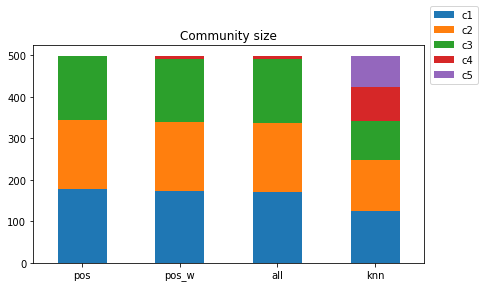

In [124]:
#Compiles gene lists per community
def get_community_table():
    comm_counts=pd.DataFrame()
    gene_lists=pd.DataFrame()
    for i in [0,1,2,3]:
        graph=[pos_w,pos_w,all_u,knn][i]
        comm=[pos_comm,pos_w_comm,all_comm,knn_comm][i]
        name=['pos','pos_w','all','knn'][i]
        temp=pd.DataFrame(list(zip(graph.vs['name'],[x+1 for x in comm.membership]))).rename(columns={0:'gene',1:'community'})
        counts=pd.DataFrame(temp.groupby('community')['gene'].agg(len))
        counts.columns=[name]
        comm_counts=pd.concat([comm_counts, counts],1)
        
        gl=pd.DataFrame(temp.groupby('community')['gene'].apply(list)).reset_index()
        gl['community']=['c'+str(i) for i in gl['community']]
        gl['network']=name
        gl=gl.loc[:,['network','community','gene']]
        gene_lists=pd.concat([gene_lists, gl])
        
    comm_counts.index=['c'+str(i) for i in comm_counts.index]
    return([comm_counts,gene_lists])

#Plotting community sizes
import seaborn as sns
fig, ax = plt.subplots(figsize=(7, 4))
get_community_table()[0].fillna(0).T.plot(kind='bar', stacked=True, ax=ax);
ax.legend(get_community_table()[0].index, loc='right', bbox_to_anchor=(1.15, 1));
ax.set_title('Community size')
plt.xticks(rotation=0)
plt.show()

**Functional analysis**  
In order to perform functional enrichment, we will extract each of the communities and perform a hypergeometric test to understand whether they are particularly enriched in specific biological functions.  
We will use [enrichr](https://gseapy.readthedocs.io/en/master/gseapy_example.html#2.-Enrichr-Example) to perform the gene set enrichment analysis. As background we will use the full list of genes that were quantified.

We will look at 3 gene set libraries. Should you have other kinds of data, enrichr allows you to define your own feature sets and perform a similar analysis. The challenge is in identifying comprehensive and well curated gene sets.

In [107]:
#All the available human libraries
gp.get_library_name(database='Human')

['ARCHS4_Cell-lines',
 'ARCHS4_IDG_Coexp',
 'ARCHS4_Kinases_Coexp',
 'ARCHS4_TFs_Coexp',
 'ARCHS4_Tissues',
 'Achilles_fitness_decrease',
 'Achilles_fitness_increase',
 'Aging_Perturbations_from_GEO_down',
 'Aging_Perturbations_from_GEO_up',
 'Allen_Brain_Atlas_down',
 'Allen_Brain_Atlas_up',
 'BioCarta_2013',
 'BioCarta_2015',
 'BioCarta_2016',
 'BioPlex_2017',
 'CORUM',
 'Cancer_Cell_Line_Encyclopedia',
 'ChEA_2013',
 'ChEA_2015',
 'ChEA_2016',
 'Chromosome_Location',
 'Chromosome_Location_hg19',
 'DSigDB',
 'Data_Acquisition_Method_Most_Popular_Genes',
 'DepMap_WG_CRISPR_Screens_Broad_CellLines_2019',
 'DepMap_WG_CRISPR_Screens_Sanger_CellLines_2019',
 'Disease_Perturbations_from_GEO_down',
 'Disease_Perturbations_from_GEO_up',
 'Disease_Signatures_from_GEO_down_2014',
 'Disease_Signatures_from_GEO_up_2014',
 'DrugMatrix',
 'Drug_Perturbations_from_GEO_2014',
 'Drug_Perturbations_from_GEO_down',
 'Drug_Perturbations_from_GEO_up',
 'ENCODE_Histone_Modifications_2013',
 'ENCODE_Histon

In [ ]:
#we will search 3 libraries for significantly enriched gene sets
gene_sets=['GO_Biological_Process_2018','KEGG_2019_Human','OMIM_Disease']
background=all_u.copy().vs['name']

def perform_enrich(network):
    temp=get_community_table()[1].copy()
    temp=temp.loc[temp['network']==network]
    output_enrichr=pd.DataFrame()
    for comm in temp['community'].values:
        gl=list(temp.loc[temp['community']==comm, 'gene'])[0]
        for bp in gene_sets:
            print('Analyzing '+network+'  | Comm: '+comm+'/'+str(len(temp.index))+'  | BP: '+bp)
            enr=gp.enrichr(
                gene_list=gl,
                gene_sets=bp,
                background=background,
                outdir='data/Enrichr',
                format='png'
            )

            results=enr.results.sort_values('Adjusted P-value', ascending=True)
            results=results.loc[results['Adjusted P-value']<0.05,]
            results['BP']=bp
            results['Comm']=comm
            results['Graph']=network
            output_enrichr=pd.concat([output_enrichr, results])
            
    return(output_enrichr)

all_enriched=pd.DataFrame()
for net in ['pos', 'pos_w', 'all', 'knn']:
    all_enriched=pd.concat([all_enriched,perform_enrich(net)])

Analyzing pos  | Comm: c1/3  | BP: GO_Biological_Process_2018
Analyzing pos  | Comm: c1/3  | BP: KEGG_2019_Human


2019-09-08 12:58:10,347 Warning: No enrich terms using library KEGG_2019_Human when cutoff = 0.05


Analyzing pos  | Comm: c1/3  | BP: OMIM_Disease


2019-09-08 12:58:13,341 Warning: No enrich terms using library OMIM_Disease when cutoff = 0.05


Analyzing pos  | Comm: c2/3  | BP: GO_Biological_Process_2018
Analyzing pos  | Comm: c2/3  | BP: KEGG_2019_Human
Analyzing pos  | Comm: c2/3  | BP: OMIM_Disease
Analyzing pos  | Comm: c3/3  | BP: GO_Biological_Process_2018
Analyzing pos  | Comm: c3/3  | BP: KEGG_2019_Human
Analyzing pos  | Comm: c3/3  | BP: OMIM_Disease


2019-09-08 12:58:35,683 Warning: No enrich terms using library OMIM_Disease when cutoff = 0.05


Analyzing pos_w  | Comm: c1/4  | BP: GO_Biological_Process_2018
Analyzing pos_w  | Comm: c1/4  | BP: KEGG_2019_Human


2019-09-08 12:58:42,788 Warning: No enrich terms using library KEGG_2019_Human when cutoff = 0.05


Analyzing pos_w  | Comm: c1/4  | BP: OMIM_Disease


2019-09-08 12:58:45,864 Warning: No enrich terms using library OMIM_Disease when cutoff = 0.05


Analyzing pos_w  | Comm: c2/4  | BP: GO_Biological_Process_2018
Analyzing pos_w  | Comm: c2/4  | BP: KEGG_2019_Human
Analyzing pos_w  | Comm: c2/4  | BP: OMIM_Disease
Analyzing pos_w  | Comm: c3/4  | BP: GO_Biological_Process_2018
Analyzing pos_w  | Comm: c3/4  | BP: KEGG_2019_Human
Analyzing pos_w  | Comm: c3/4  | BP: OMIM_Disease


2019-09-08 12:59:08,376 Warning: No enrich terms using library OMIM_Disease when cutoff = 0.05


Analyzing pos_w  | Comm: c4/4  | BP: GO_Biological_Process_2018


Running the command above not only gives you the results after significance testing (Q<0.05), but it also outputs some preliminary barplots with the statistically significant results (found under `/data/Enrichr/`). For instance:
<img src="data/Enrichr/GO_Biological_Process_2018..enrichr.reports.png">

In [603]:
enriched_terms=all_enriched.loc[:,['Graph','Comm','Term','Adjusted P-value']].copy()

In [605]:
enriched_terms['Adjusted P-value']=-1*np.log10(enriched_terms['Adjusted P-value'])

In [608]:
enriched_terms.head()

,Graph,Comm,Term,Adjusted P-value
0,pos,c1,activation of GTPase activity (GO:0090630),1.338939
0,pos,c2,SRP-dependent cotranslational protein targetin...,69.100010
1,pos,c2,cotranslational protein targeting to membrane ...,68.215998
2,pos,c2,protein targeting to ER (GO:0045047),67.276941
3,pos,c2,viral gene expression (GO:0019080),64.172620


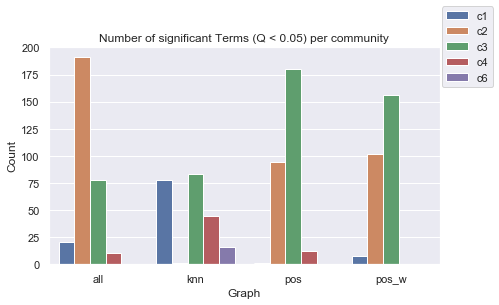

In [630]:
import seaborn as sns
fig, ax = plt.subplots(figsize=(7, 4))
data_bars=pd.DataFrame(enriched_terms.groupby(['Graph','Comm'])['Term'].agg('count')).stack().reset_index().rename(columns={0:'Count'})
sns.barplot(x='Graph', y='Count', data=data_bars, hue='Comm')
ax.set_title('Number of significant Terms (Q < 0.05) per community')
ax.legend(loc='right', bbox_to_anchor=(1.15, 1));
plt.xticks(rotation=0)
plt.show()

Note that some of these communities are very big, which explains the big number of biological processes found above.

In [635]:
#Number of genes/community
get_community_table()[0].fillna(0).T

,cA,cB,cC,cD,cE,cF
pos,173.0,166.0,153.0,7.0,0.0,0.0
pos_w,179.0,172.0,148.0,0.0,0.0,0.0
all,174.0,168.0,151.0,6.0,0.0,0.0
knn,103.0,96.0,80.0,77.0,72.0,71.0


We can now find whether the Full Network, Positively co-expressed, and Positively co-expressed weighted, show any common terms among their biggest communities. We do not compare with kNN-G as this shows very homogeneous and different communities than the other two networks

In [681]:
#Finding consensus
temp=enriched_terms.copy()
temp['comm_term']=temp.Comm+'_'+temp.Term
temp=temp.loc[:,['Graph','comm_term']]

consensus=pd.DataFrame()
consensus=pd.concat([consensus, temp.loc[temp['Graph']=='pos']])
consensus=pd.merge(consensus,
                   temp.loc[temp['Graph']=='pos_w'], on="comm_term", how='outer', suffixes=['pos','pos_w'])
consensus=pd.merge(consensus, 
                   temp.loc[temp['Graph']=='all'], on="comm_term", how='outer').rename(columns={'Graph':'all'})

consensus=consensus.loc[consensus.isna().sum(1)==0].loc[:,['comm_term','Graphpos','Graphpos_w','all']]

Among the biggest communities we find several biological processes (55) that are simultaneously identified in the same community in the three graphs (`Full`, `Pos coexp`, and `Pos coexp weighted`).

In [682]:
consensus['comm']=[x[0] for x in consensus.comm_term.str.split('\_')]
consensus.groupby('comm')['comm_term'].agg('count')

comm
c1     1
c2    34
c3    20
Name: comm_term, dtype: int64

**Questions**  
- Do you think the communities above present a decent size (number of nodes)? Would you have analyzed a community if it only had 5 nodes?
- Having identified these communities, how would you try to validate them?
- Would you now determine the relevant community to investigate further?


# Conclusion

Here we've performed some network analyses based on a co-expression network. We've explored different centrality measures to characterize the networks and have characterized their communities. It remains to see whether these communities would be identified using other integrative approaches.